In [26]:
# 定义全局函数便于直接调用处理
import pandas as pd
import numpy as np
from datetime import date
import datetime as dt
import seaborn as sns
import matplotlib.pyplot as plt

% matplotlib inline
import warnings
warnings.filterwarnings("ignore")
############全局参数#################################
discrete_list = ['pax_name_passport', 'seg_route_from', 'seg_route_to', 'seg_flight', 'seg_cabin',
                 'seg_dep_time', 'emd_lable', 'gender', 'age', 'birth_date', 'residence_country', 'nation_name',
                 'city_name',
                 'province_name', 'marital_stat', 'ffp_nbr', 'member_level', 'often_city', 'enroll_chnl',
                 'pref_aircraft_m3_1', 'pref_aircraft_m3_2', 'pref_aircraft_m3_3', 'pref_aircraft_m3_4',
                 'pref_aircraft_m3_5', 'pref_aircraft_m6_1', 'pref_aircraft_m6_2', 'pref_aircraft_m6_3',
                 'pref_aircraft_m6_4', 'pref_aircraft_m6_5', 'pref_aircraft_y1_1', 'pref_aircraft_y1_2',
                 'pref_aircraft_y1_3', 'pref_aircraft_y1_4', 'pref_aircraft_y1_5', 'pref_aircraft_y2_1',
                 'pref_aircraft_y2_2', 'pref_aircraft_y2_3', 'pref_aircraft_y2_4', 'pref_aircraft_y2_5',
                 'pref_aircraft_y3_1', 'pref_aircraft_y3_2', 'pref_aircraft_y3_3', 'pref_aircraft_y3_4',
                 'pref_aircraft_y3_5', 'pref_orig_m3_1', 'pref_orig_m3_2', 'pref_orig_m3_3', 'pref_orig_m3_4',
                 'pref_orig_m3_5', 'pref_orig_m6_1', 'pref_orig_m6_2', 'pref_orig_m6_3', 'pref_orig_m6_4',
                 'pref_orig_m6_5', 'pref_orig_y1_1', 'pref_orig_y1_2', 'pref_orig_y1_3', 'pref_orig_y1_4',
                 'pref_orig_y1_5', 'pref_orig_y2_1', 'pref_orig_y2_2', 'pref_orig_y2_3', 'pref_orig_y2_4',
                 'pref_orig_y2_5', 'pref_orig_y3_1', 'pref_orig_y3_2', 'pref_orig_y3_3', 'pref_orig_y3_4',
                 'pref_orig_y3_5', 'pref_line_m3_1', 'pref_line_m3_2', 'pref_line_m3_3', 'pref_line_m3_4',
                 'pref_line_m3_5', 'pref_line_m6_1', 'pref_line_m6_2', 'pref_line_m6_3', 'pref_line_m6_4',
                 'pref_line_m6_5', 'pref_line_y1_1', 'pref_line_y1_2', 'pref_line_y1_3', 'pref_line_y1_4',
                 'pref_line_y1_5', 'pref_line_y2_1', 'pref_line_y2_2', 'pref_line_y2_3', 'pref_line_y2_4',
                 'pref_line_y2_5', 'pref_line_y3_1', 'pref_line_y3_2', 'pref_line_y3_3', 'pref_line_y3_4',
                 'pref_line_y3_5', 'pref_city_m3_1', 'pref_city_m3_2', 'pref_city_m3_3', 'pref_city_m3_4',
                 'pref_city_m3_5', 'pref_city_m6_1', 'pref_city_m6_2', 'pref_city_m6_3', 'pref_city_m6_4',
                 'pref_city_m6_5', 'pref_city_y1_1', 'pref_city_y1_2', 'pref_city_y1_3', 'pref_city_y1_4',
                 'pref_city_y1_5', 'pref_city_y2_1', 'pref_city_y2_2', 'pref_city_y2_3', 'pref_city_y2_4',
                 'pref_city_y2_5', 'pref_city_y3_1', 'pref_city_y3_2', 'pref_city_y3_3', 'pref_city_y3_4',
                 'pref_city_y3_5', 'recent_flt_day', 'pit_add_chnl_m3', 'pit_add_chnl_m6', 'pit_add_chnl_y1',
                 'pit_add_chnl_y2', 'pit_add_chnl_y3', 'pref_orig_city_m3', 'pref_orig_city_m6', 'pref_orig_city_y1',
                 'pref_orig_city_y2', 'pref_orig_city_y3', 'pref_dest_city_m3', 'pref_dest_city_m6',
                 'pref_dest_city_y1', 'pref_dest_city_y2', 'pref_dest_city_y3'
                 ]  # 离散型的特征
drop_list = []  # 在预处理阶段发现与测试集明显不同的特征，需要预先处理掉

############目录定义#################################
datapath = 'D:/outsourcing/data/'
featurepath = 'D:/outsourcing/feature/'
resultpath = 'D:/outsourcing/result/'
tmppath = 'D:/outsourcing/tmp/'


###############函数定义################################
# reduce memory
def read_csv(file_name, num_rows=None):
    if num_rows is None:
        return pd.read_csv(file_name)
    return pd.read_csv(file_name, nrows=num_rows)


def reduce_mem_usage(df, verbose=True):
    start_mem = df.memory_usage().sum() / 1024 ** 2
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)

    end_mem = df.memory_usage().sum() / 1024 ** 2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    return df


In [115]:
train = reduce_mem_usage(read_csv(datapath + "clean_train.csv"))
test = reduce_mem_usage(read_csv(datapath + "clean_test.csv"))


Memory usage after optimization is: 42.95 MB
Decreased by 63.4%
Memory usage after optimization is: 12.24 MB
Decreased by 63.9%


In [116]:
train.head(5)

,seg_route_from,seg_route_to,seg_flight,seg_cabin,seg_dep_time,pax_fcny,pax_tax,emd_lable,emd_lable2,gender,...,pit_pay_avg_amt_m6,pit_pay_avg_amt_y1,pit_pay_avg_amt_y2,pit_pay_avg_amt_y3,pit_add_chnl_m3,pit_add_chnl_m6,pit_add_chnl_y1,pit_add_chnl_y2,pit_add_chnl_y3,pax_name_passport
0,PVG,JFK,AB1006,J,2018/12/16 20:00,4161.0,584.429993,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,9612c51f08718e48b1361e415ef55be99612c51f08718e...
1,PVG,JFK,AB1006,J,2019/2/18 20:00,1670.0,248.800003,1,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,c7ca533cd9da4c4bf3d597248f90bc6ec7ca533cd9da4c...
2,PVG,LAX,AB1009,Y,2018/3/9 13:20,243.0,301.309998,1,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,bd2cb6b0dd56fb3de6f7c018296a07e2bd2cb6b0dd56fb...
3,PVG,LAX,AB1009,Y,2018/1/2 13:20,1362.0,454.160004,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,65657872fe131ea7651565638dcb568365657872fe131e...
4,PVG,JFK,AB1010,Y,2018/7/6 11:30,675.0,284.109985,1,1,M,...,0.0,0.0,0.0,0.0,0,0,0,0,0,722261f7b860b183da9fe0b6630b6dbf722261f7b860b1...


In [117]:
test.head(5)

,seg_route_from,seg_route_to,seg_flight,seg_cabin,seg_dep_time,pax_fcny,pax_tax,emd_lable,emd_lable2,gender,...,pit_pay_avg_amt_m6,pit_pay_avg_amt_y1,pit_pay_avg_amt_y2,pit_pay_avg_amt_y3,pit_add_chnl_m3,pit_add_chnl_m6,pit_add_chnl_y1,pit_add_chnl_y2,pit_add_chnl_y3,pax_name_passport
0,PVG,JFK,AB1010,Y,2019/4/10 11:30,339.0,227.809998,0,0,0,...,0,0.0,0.0,0.0,0,0,0,0,0,21f0b1c838160ac26cb2c57660bc3fd521f0b1c838160a...
1,PVG,LAX,AB1008,Y,2019/12/4 21:00,255.0,250.149994,0,0,0,...,0,0.0,0.0,0.0,0,0,0,0,0,21e0621a85f6db6139ff7cf2d53b4e5d21e0621a85f6db...
2,PVG,JFK,AB1010,Y,2018/11/29 11:30,479.0,411.209991,0,0,0,...,0,0.0,0.0,0.0,0,0,0,0,0,197b215b23a93b19f391c422eb27f310197b215b23a93b...
3,PVG,LAX,AB1009,Y,2017/12/20 13:00,400.0,571.599976,0,0,F,...,0,0.0,0.0,0.0,0,0,0,0,0,92b435f20c6ce2fd5acef7b6ff49b6d092b435f20c6ce2...
4,PVG,JFK,AB1006,Y,2017/10/24 19:10,500.0,279.660004,0,0,0,...,0,0.0,0.0,0.0,0,0,0,0,0,a38ac8bfe0feb14c0469e2917bc74a05a38ac8bfe0feb1...


In [118]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23432 entries, 0 to 23431
Columns: 656 entries, seg_route_from to pax_name_passport
dtypes: float16(46), float32(35), int16(32), int32(53), int8(358), object(132)
memory usage: 43.0+ MB


In [119]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6771 entries, 0 to 6770
Columns: 656 entries, seg_route_from to pax_name_passport
dtypes: float16(44), float32(29), int16(31), int32(51), int8(369), object(132)
memory usage: 12.2+ MB


In [121]:
train.describe()

,pax_fcny,pax_tax,emd_lable,emd_lable2,ffp_nbr,often_city,cabin_hf_cnt_m3,cabin_hf_cnt_m6,cabin_hf_cnt_y1,cabin_hf_cnt_y2,...,pit_income_avg_amt_m3,pit_income_avg_amt_m6,pit_income_avg_amt_y1,pit_income_avg_amt_y2,pit_income_avg_amt_y3,pit_pay_avg_amt_m3,pit_pay_avg_amt_m6,pit_pay_avg_amt_y1,pit_pay_avg_amt_y2,pit_pay_avg_amt_y3
count,2.343200e+04,23432.000000,23432.000000,23432.000000,2.343200e+04,23432.0,23432.000000,23432.000000,23432.000000,23432.000000,...,23432.0,23432.000000,23432.0,23432.0,23432.0,23432.000000,23432.000000,23432.000000,23432.000000,23432.000000
mean,2.228530e+04,15419.392578,0.307357,0.062948,1.191666e+11,0.0,0.001152,0.001494,0.002390,0.011821,...,inf,156.219193,inf,inf,inf,13.526929,391.267487,558.013855,748.363159,807.320312
std,1.178487e+05,69443.023438,0.461409,0.242875,2.476115e+11,0.0,0.044772,0.049300,0.063294,0.262108,...,inf,1531.406616,inf,inf,inf,1015.707057,6437.739258,7310.016602,7814.223145,7856.875000
min,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.177500e+02,242.524998,0.000000,0.000000,0.000000e+00,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5.680000e+02,299.359985,0.000000,0.000000,0.000000e+00,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.196000e+03,454.059998,1.000000,0.000000,0.000000e+00,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
max,4.264300e+06,636700.000000,1.000000,1.000000,6.640210e+11,0.0,2.000000,2.000000,3.000000,21.000000,...,24720.0,75838.000000,51840.0,48288.0,58784.0,88000.000000,250000.000000,250000.000000,231000.000000,255750.000000


In [102]:
#统计缺失值占比情况，对训练集与测试集分别进行对比
for column in discrete_list:
    column_train = train[column]
    column_test = test[column]
    try:
        temp1 = column_train.value_counts()['0']
        temp2 = column_test.value_counts()['0']
        print(column+":    ",temp1/column_train.shape[0],temp2/column_test.shape[0])
    except KeyError:
        continue
#可以看出缺失值非常多，且相同列的情况下，测试集的缺失值更多一些
#这里只是离散值的情况，因为连续值的缺失值与0值不好判断区别！！！！！！

gender:     0.7950238989416183 0.9453551912568307
age:     0.8306589279617617 0.951262738147984
birth_date:     0.8464066234209627 0.9545118889381184
residence_country:     0.8118385114373506 0.9480135873578497
nation_name:     0.8487111642198703 0.9568749076945798
city_name:     0.9577500853533629 0.9825727366710973
province_name:     0.9433680437009219 0.9850834440998375
marital_stat:     0.9747354045749402 0.9901048589573179
member_level:     0.8464066234209627 0.9545118889381184
enroll_chnl:     0.8464066234209627 0.9545118889381184
pref_aircraft_m3_1:     0.917420621372482 0.9635208979471275
pref_aircraft_m3_2:     0.9600119494708091 0.9626347659134544
pref_aircraft_m3_3:     0.9700409696142028 0.9750406143848767
pref_aircraft_m3_4:     0.9309064527142369 0.9808004726037512
pref_aircraft_m3_5:     0.9327842266985319 0.9822773593265397
pref_aircraft_m6_1:     0.9338511437350632 0.9379707576428888
pref_aircraft_m6_2:     0.9338511437350632 0.9379707576428888
pref_aircraft_m6_3:     

In [76]:
train['emd_lable2'].value_counts()

0    21957
1     1475
Name: emd_lable2, dtype: int64

# 对训练集与测试集的连续值分别做箱线图剔除异常值

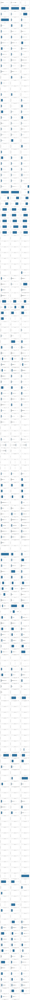

In [123]:
fig = plt.figure(figsize=(20, 700))
i = 0
for column in train.columns.tolist():
    if column in discrete_list:
        continue
    else:
        plt.subplot(174, 3, i+1)
        sns.boxplot(train[column][train[column] != 0], orient='v', width=0.5)#删除了所有0值查看结果
        plt.ylabel(column, fontsize=10)
        i = i + 1
plt.show()

## 训练集上的异常数据与对应的清理方法
#### pax_fcny与pax_tax数据存在过大数据
#### 距离生日天数重新计算，缺失值不应该为0，设置为365
#### dist_cnt_y2数据错误，flt_nature_cnt_y2同样
#### avg_dist_cnt数据集中在两端，不符合正态分布，距离类数据存在非常大的方差，机票消费价格同样存在非常大的异常
#### flt_delay_time_y3丢失了大量负数数据？此类数据存在大量负数，数据左偏


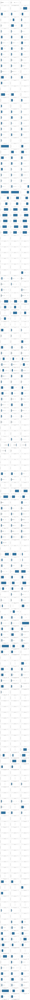

In [124]:
fig = plt.figure(figsize=(20, 700))
i = 0
for column in test.columns.tolist():
    if column in discrete_list:
        continue
    else:
        try:
            plt.subplot(174, 3, i+1)
            sns.boxplot(test[column][test[column] != 0], orient='v', width=0.5)
            plt.ylabel(column, fontsize=10)
            i = i + 1
        except TypeError:
            pass
plt.show()

# 连续值绘制分布直方图与正态QQ图

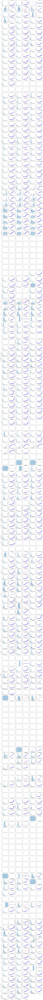

In [125]:
#去除值为0的缺失值
from scipy import stats
from numpy.linalg import LinAlgError
train_cols = 6
train_rows = 260  # 因为不能画出这么大的图片，先画出一部分随机抽取的
plt.figure(figsize=(4 * train_cols, 3.5 * train_rows))
i = 0
for col in train.columns.tolist():
    if col in discrete_list:
        continue
    else:
        try:
            i += 1
            ax = plt.subplot(train_rows, train_cols, i)
            sns.distplot(train[col][train[col] != 0], fit=stats.norm)
        except ValueError:
            pass
        except LinAlgError:
            pass
        try:
            i += 1
            ax = plt.subplot(train_rows, train_cols, i)
            res = stats.probplot(train[col][train[col] != 0], plot=plt)
        except ValueError:
            pass
        except LinAlgError:
            pass
        continue
plt.show()

# 连续值数据分布得到的结论

### 剔除缺失值数据后，数据整体右偏，趋势明显，应当进行单列变化趋向正态分布

### 异常值数量较多，可以使用Box-Cox变化减弱离群数据的影响  ###


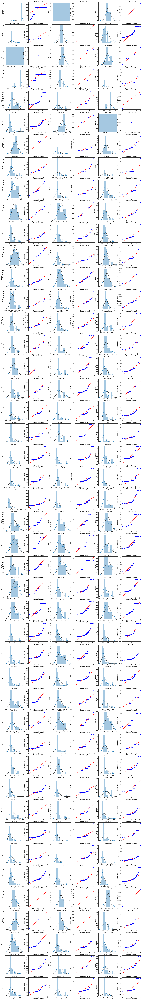

In [126]:
#离散特征计算其每种取值对应的付费选座概率，产生        概率分布图与Q-Q图——不同类别取值的付费概率
train_cols = 6
train_rows = len(discrete_list)
plt.figure(figsize=(4 * train_cols, 4 * train_rows))
i = 0
for col in discrete_list:
    buy_rate = [rate for rate in train.groupby([col])['emd_lable2'].mean()
                if rate > 0 and rate <= 1]
    i += 1
    try:
        ax = plt.subplot(train_rows, train_cols, i)
        sns.distplot(buy_rate, fit=stats.norm)
        ax.set_xlabel(col)
    except ValueError:
        pass
    try:
        i += 1
        ax = plt.subplot(train_rows, train_cols, i)
        res = stats.probplot(buy_rate, plot=plt)
    except ValueError:
        pass

#   离散值详细分析后得到的结论
不同的离散取值有不同的付费概率，可以看出概率大部分较小
seg_flight、pref-aircraft有较大作用，存在一些取值对目标列有较大的相关性！！！
判定target_encoding是合理的

# 对所有连续值可以使用KDE分布图来判断

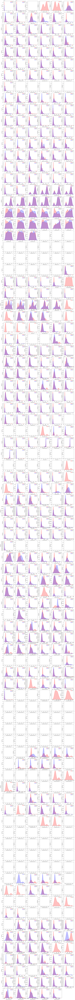

In [127]:
#KDE分布图——核密度估计，可以进行特征的初步筛选
dist_cols = 6
dist_rows = 87
plt.figure(figsize=(4*dist_cols,4*dist_rows))
i = 1
for col in train.columns.tolist():
    if col in discrete_list:
        continue
    else:
        ax = plt.subplot(dist_rows, dist_cols, i)
        ax = sns.kdeplot(train[col][train[col]!=0], color="Red", shade=True)
        ax = sns.kdeplot(test[col][test[col]!=0], color="Blue", shade=True)
        ax.set_xlabel(col)
        ax.set_ylabel("Frequency")
        ax = ax.legend(["train", "test"])
        i = i + 1
plt.show()
#结论：删除了部分训练集与测试集明显分布不同的特征，但决策树模型在训练集上效果有所降低！之前的模型有较大过拟合风险！

In [128]:
drop_features=['emd_lable','cabin_hf_cnt_m3','cabin_hf_cnt_m6','complain_valid_cnt_m3','complain_valid_cnt_m6','bag_cnt_m6',
              'bag_cnt_y1','bag_cnt_y2','bag_cnt_y3','flt_cancel_cnt_y3','cabin_fall_cnt_y3','complain_cnt_m3','complain_cnt_m6','pit_out_amt',
              'pit_add_non_amt_m3','pit_add_buy_amt_y2','pit_add_buy_amt_y3','pit_des_out_amt_m3','pit_des_out_amt_m6','pit_des_out_amt_y1','pit_add_non_cnt_m3','pit_add_bug_cnt_y2',
              'pit_add_bug_cnt_y3','pit_des_mall_cnt_m6','pit_des_mall_cnt_y1','pit_des_out_cnt_m6','pit_des_out_cnt_y1','pit_ech_avg_amt_m3',
              'pit_out_avg_amt_m3','pit_out_avg_amt_m6']